# Image Processing


## HOG Features

1. Write a Python script to compute the HOG features of a given image using a library such as
OpenCV or scikit-image.
2. Apply your implementation to at least three different images, including both simple and
complex scenes.
3. Visualize the original image, the gradient image, and the HOG feature image.
4. Compare the HOG features extracted from different images. Discuss the impact of varying
parameters like cell size, block size, and the number of bins on the resulting HOG
descriptors.

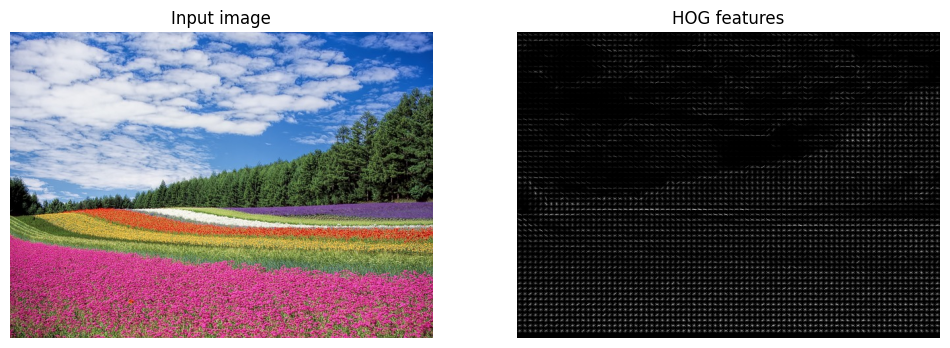

In [348]:
from skimage import feature, io, color
import matplotlib.pyplot as plt

# Load the image

image = io.imread('flower_field.jpg')

# Convert the image to grayscale
#image = color.rgb2(image)

# Compute HOG features and the HOG image
hog_features, hog_image = feature.hog(image, 
                                      pixels_per_cell=(8, 8),
                                      cells_per_block=(2, 2),
                                      visualize=True,
                                      channel_axis=-1
                                      )

# Plot the original image and the HOG image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image)
ax1.set_title('Input image')

ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('HOG features')

plt.show()

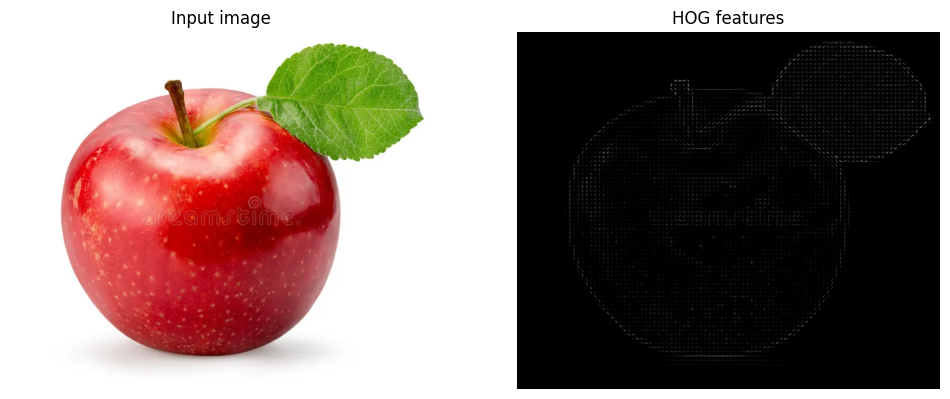

In [349]:
# Load the image

image = io.imread('red_apple.webp')

# Convert the image to grayscale
#image = color.rgb2(image)

# Compute HOG features and the HOG image
hog_features, hog_image = feature.hog(image, 
                                      pixels_per_cell=(8, 8),
                                      cells_per_block=(2, 2),
                                      visualize=True,
                                      channel_axis=-1
                                      )

# Plot the original image and the HOG image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image)
ax1.set_title('Input image')

ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('HOG features')

plt.show()

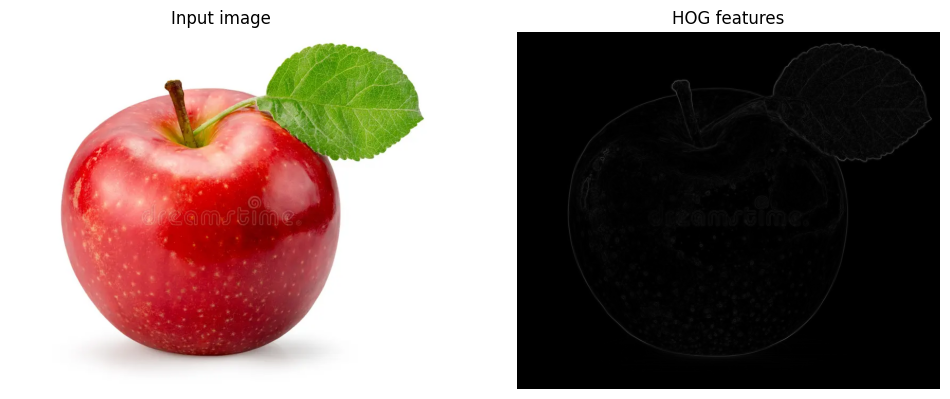

In [350]:
# Load the image

image = io.imread('red_apple.webp')

# Convert the image to grayscale
# image = color.rgb2(image)

# Compute HOG features and the HOG image
hog_features, hog_image = feature.hog(image, 
                                      orientations=12,           # Number of orientation bins
                                      pixels_per_cell=(2, 2),   # Size of each cell (e.g., 8x8 pixels)
                                      cells_per_block=(20, 20),   # Block size (e.g., 2x2 cells per block)
                                      visualize=True,
                                      channel_axis=-1
                                      )

# Plot the original image and the HOG image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image)
ax1.set_title('Input image')

ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('HOG features')

plt.show()

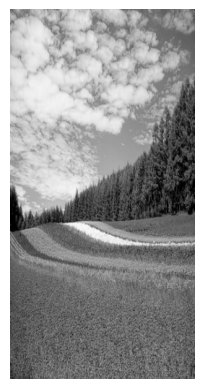

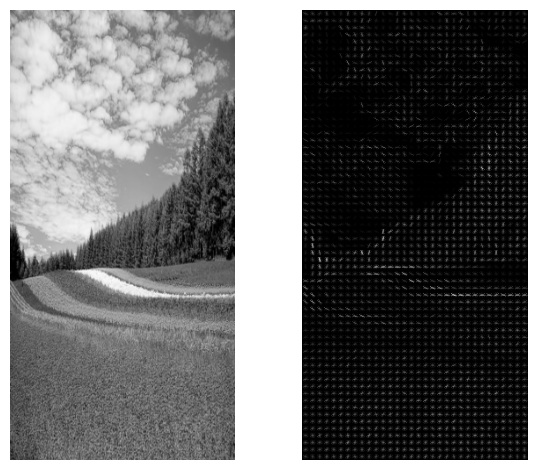

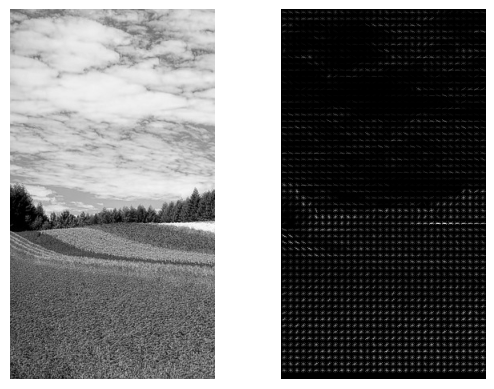

In [351]:
from skimage.feature import hog
from skimage import io
from skimage.transform import resize
import matplotlib.pyplot as plt
import cv2

# Load the black-and-white image
image = io.imread('flower_field.jpg')

# Ensure the image is grayscale (2D)
if len(image.shape) == 3 and image.shape[2] == 3:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Resize the image for HOG
resized_img = resize(image, (128 * 4, 64 * 4), anti_aliasing=True)

# Display the resized grayscale image
plt.axis("off")
plt.imshow(resized_img, cmap='gray')  # Make sure to use cmap='gray'
plt.show()

# Compute HOG features and visualization
fd, hog_image = hog(resized_img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

# Display the HOG visualization
plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(resized_img, cmap='gray')  # Grayscale input

plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(hog_image, cmap='gray')  # HOG result in grayscale

plt.tight_layout()
plt.show()

# Cropping the image and applying HOG
x, y, h, w = 0, 0, 512, 256
crop_img = image[y:y + h, x:x + w]

# Ensure cropped image is treated as grayscale
fd_crop_img, hog_crop_img = hog(crop_img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

# Display the cropped image and its HOG
plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(crop_img, cmap='gray')  # Display cropped image in grayscale

plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(hog_crop_img, cmap='gray')  # HOG visualization in grayscale

plt.show()


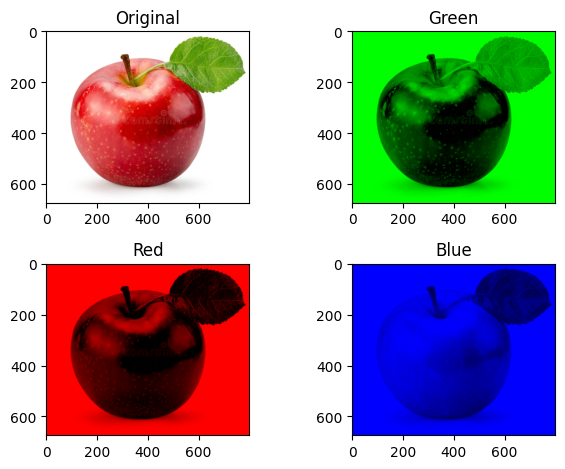

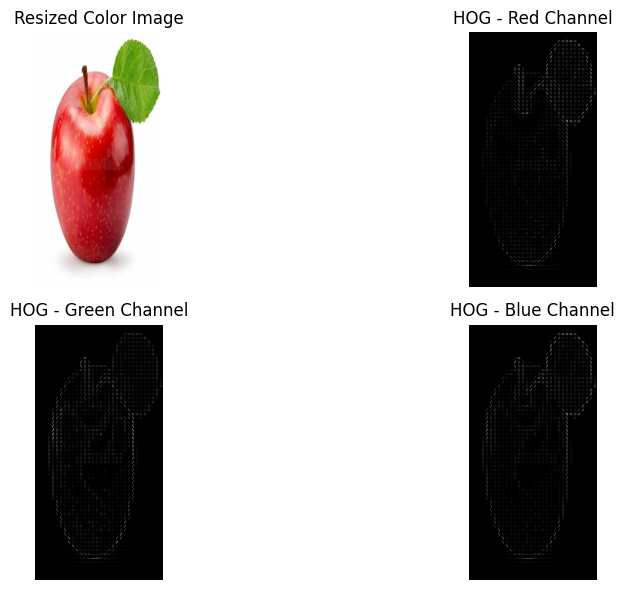

Combined HOG feature vector shape: (210924,)


In [352]:
from skimage.feature import hog
from skimage import io
from skimage.transform import resize
import matplotlib.pyplot as plt
import numpy as np

# Load the color image
image = io.imread('red_apple.webp')


b = image.copy()
# set green and red channels to 0
b[:, :, 1] = 0
b[:, :, 2] = 0


g = image.copy()
# set blue and red channels to 0
g[:, :, 0] = 0
g[:, :, 2] = 0

r = image.copy()
# set blue and green channels to 0
r[:, :, 0] = 0
r[:, :, 1] = 0


plt.subplot(2,2,1)
plt.title("Original")
plt.imshow(image)
 
    
plt.subplot(2,2,2)
plt.title("Green")
plt.imshow(cv2.cvtColor(g, cv2.COLOR_BGR2RGB))

 
plt.subplot(2,2,3)
plt.title("Red")
plt.imshow(cv2.cvtColor(r, cv2.COLOR_BGR2RGB))


plt.subplot(2,2,4)
plt.title("Blue")
plt.imshow(cv2.cvtColor(b, cv2.COLOR_BGR2RGB))

 
plt.tight_layout()
plt.show()


# Resize the image for HOG
resized_img = resize(image, (128 * 4, 64 * 4), anti_aliasing=True)

# Split into color channels (R, G, B)
r_channel = resized_img[:, :, 0]
g_channel = resized_img[:, :, 1]
b_channel = resized_img[:, :, 2]

# Compute HOG for each channel
fd_r, hog_image_r = hog(r_channel, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)
fd_g, hog_image_g = hog(g_channel, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)
fd_b, hog_image_b = hog(b_channel, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

# Concatenate the HOG features from each channel
hog_features_combined = np.concatenate([fd_r, fd_g, fd_b])

# Visualize the HOG for each channel
plt.figure(figsize=(12, 6))

# Original resized image
plt.subplot(2, 2, 1)
plt.axis("off")
plt.title('Resized Color Image')
plt.imshow(resized_img)

# HOG for Red channel
plt.subplot(2, 2, 2)
plt.axis("off")
plt.title('HOG - Red Channel')
plt.imshow(hog_image_r, cmap='gray')

# HOG for Green channel
plt.subplot(2, 2, 3)
plt.axis("off")
plt.title('HOG - Green Channel')
plt.imshow(hog_image_g, cmap='gray')

# HOG for Blue channel
plt.subplot(2, 2, 4)
plt.axis("off")
plt.title('HOG - Blue Channel')
plt.imshow(hog_image_b, cmap='gray')

plt.tight_layout()
plt.show()

# Print the shape of the concatenated HOG features
print(f"Combined HOG feature vector shape: {hog_features_combined.shape}")


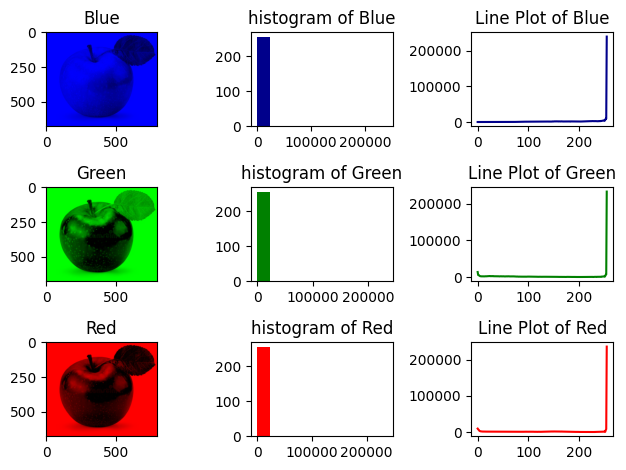

In [353]:
# Get RGB data from image
# cv2.calchist([imageObject], [channelValue], mask, [histSize], [low,high])

blue_color = cv2.calcHist([image], [0], None, [256], [0, 256])
red_color = cv2.calcHist([image], [1], None, [256], [0, 256])
green_color = cv2.calcHist([image], [2], None, [256], [0, 256])

plt.subplot(3,3,1)
plt.title("Blue")
plt.imshow(cv2.cvtColor(b, cv2.COLOR_BGR2RGB))

plt.subplot(3,3,4)
plt.title("Green")
plt.imshow(cv2.cvtColor(g, cv2.COLOR_BGR2RGB))

plt.subplot(3,3,7)
plt.title("Red")
plt.imshow(cv2.cvtColor(r, cv2.COLOR_BGR2RGB))

# three histograms
plt.subplot(3,3,2)
plt.title("histogram of Blue")
plt.hist(blue_color,color="darkblue")
 
plt.subplot(3,3,5)
plt.title("histogram of Green")
plt.hist(green_color,color="green")
 
plt.subplot(3,3,8)
plt.title("histogram of Red")
plt.hist(red_color,color="red")

# three line plots
plt.subplot(3,3,3)
plt.title("Line Plot of Blue")
plt.plot(blue_color,color="darkblue")
 
plt.subplot(3,3,6)
plt.title("Line Plot of Green")
plt.plot(green_color,color="green")
 
plt.subplot(3,3,9)
plt.title("Line Plot of Red")
plt.plot(red_color,color="red")
 
plt.tight_layout()
plt.show()

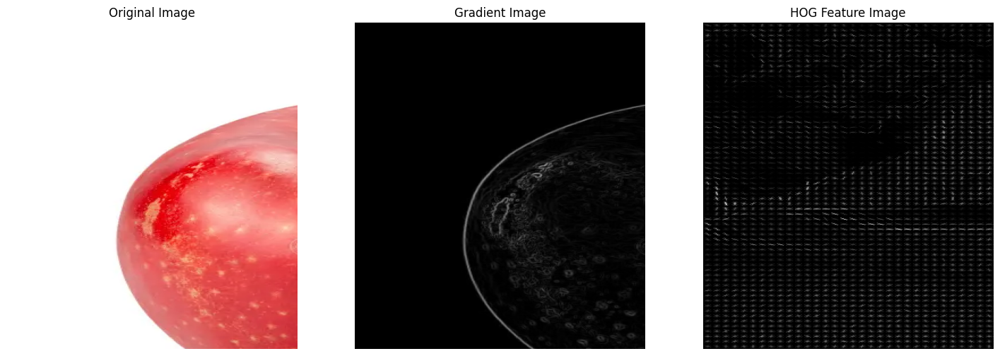

In [354]:
from skimage.filters import sobel
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

# Compute the gradient image using Sobel filter

gradient_image = sobel(rgb2gray(image))

# Plot the original image, gradient image, and HOG feature image
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, aspect='auto')
ax1.set_title('Original Image')

ax2.axis('off')
ax2.imshow(gradient_image, cmap=plt.cm.gray, aspect='auto')
ax2.set_title('Gradient Image')

ax3.axis('off')
ax3.imshow(hog_image, cmap=plt.cm.gray, aspect='auto')
ax3.set_title('HOG Feature Image')

plt.show()

## Local Binary Patterns

1. Write a Python function to compute the LBP of a given grayscale image. Use the basic 8-
neighbor LBP method.
2. Your function should output the LBP image, where each pixel is replaced by its
corresponding LBP value.
3. Write a Python function to compute the histogram of the LBP image.
4. Plot the histogram and explain what it represents in terms of the texture features of the
image.
5. Apply your LBP function to at least three different grayscale images (e.g., a natural scene, a
texture, and a face image).
6. Generate and compare the histograms of the LBP images.
7. Discuss the differences in the histograms and what they tell you about the textures of the
different images.

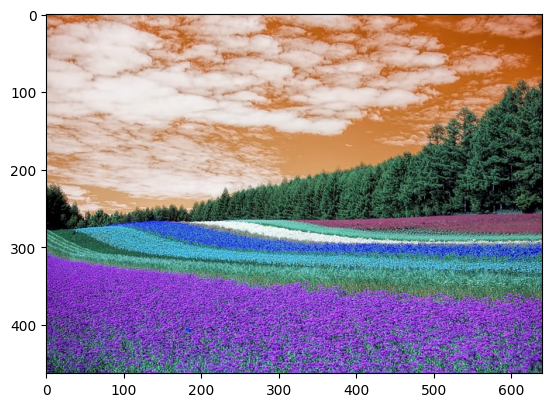

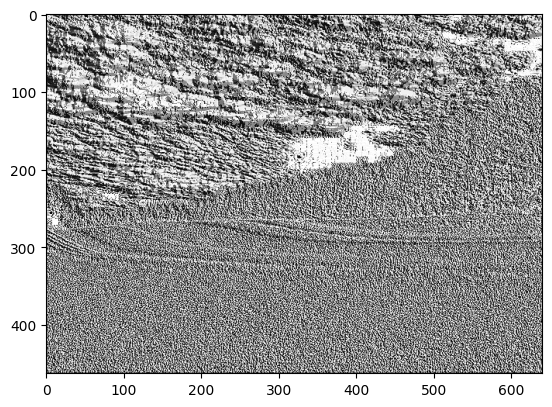

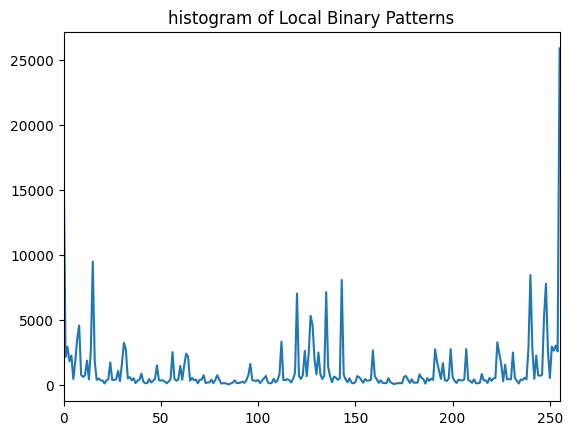

In [355]:
img = cv2.imread('flower_field.jpg',0)

# local Binary Patterns
def get_pixel(img, center, x, y):
      
    new_value = 0
      
    try:
        # If local neighbourhood pixel 
        # value is greater than or equal
        # to center pixel values then 
        # set it to 1
        if img[x][y] >= center:
            new_value = 1
              
    except:
        # Exception is required when 
        # neighbourhood value of a center
        # pixel value is null i.e. values
        # present at boundaries.
        pass
      
    return new_value
   
# Function for calculating LBP
def lbp_calculated_pixel(img, x, y):
   
    center = img[x][y]
   
    val_ar = []
      
    # top_left
    val_ar.append(get_pixel(img, center, x-1, y-1))
      
    # top
    val_ar.append(get_pixel(img, center, x-1, y))
      
    # top_right
    val_ar.append(get_pixel(img, center, x-1, y + 1))
      
    # right
    val_ar.append(get_pixel(img, center, x, y + 1))
      
    # bottom_right
    val_ar.append(get_pixel(img, center, x + 1, y + 1))
      
    # bottom
    val_ar.append(get_pixel(img, center, x + 1, y))
      
    # bottom_left
    val_ar.append(get_pixel(img, center, x + 1, y-1))
      
    # left
    val_ar.append(get_pixel(img, center, x, y-1))
       
    # Now, we need to convert binary
    # values to decimal
    power_val = [1, 2, 4, 8, 16, 32, 64, 128]
   
    val = 0
      
    for i in range(len(val_ar)):
        val += val_ar[i] * power_val[i]
          
    return val
   
path = 'flower_field.jpg'
img_bgr = cv2.imread(path, 1)

if img_bgr is None:
    raise FileNotFoundError(f"Image at path '{path}' not found.")

height, width, _ = img_bgr.shape

# We need to convert RGB image 
# into gray one because gray 
# image has one channel only.
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
   
# Create a numpy array as 
# the same height and width 
# of RGB image
img_lbp = np.zeros((height, width), np.uint8)
   
for i in range(0, height):
    for j in range(0, width):
        img_lbp[i, j] = lbp_calculated_pixel(img_gray, i, j)
  
plt.imshow(img_bgr)
plt.show()
   
plt.imshow(img_lbp, cmap ="gray")
plt.show()

#once we have the local binary patterns, now create the histogram
hist,bin = np.histogram(img_lbp.ravel(),256,[0,255])
plt.xlim([0,255])
plt.plot(hist)
plt.title('histogram of Local Binary Patterns')
plt.show()

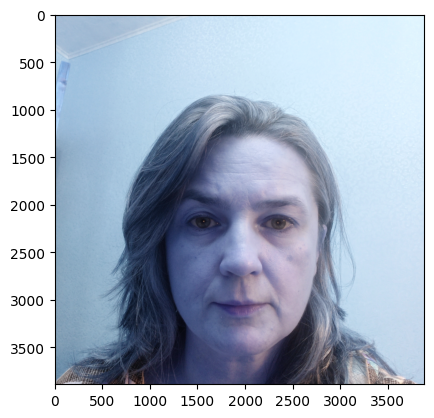

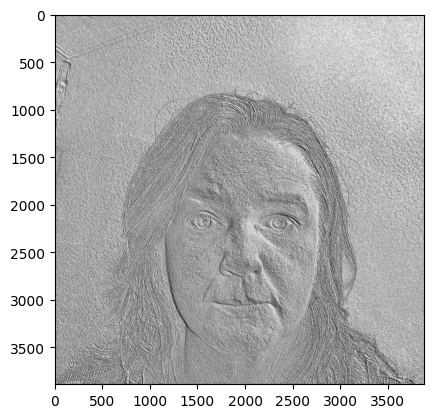

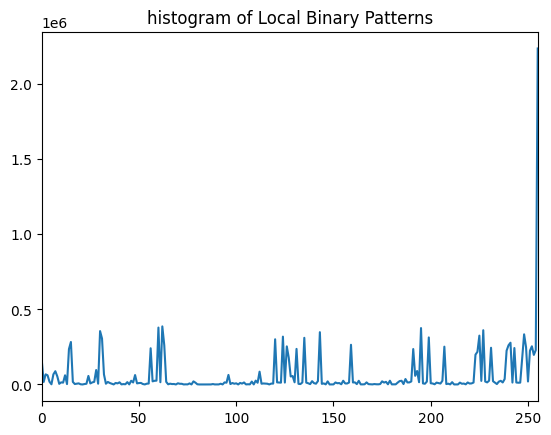

In [356]:
img = cv2.imread('images/13/Neutral.jpg',0)

# local Binary Patterns
def get_pixel(img, center, x, y):
      
    new_value = 0
      
    try:
        # If local neighbourhood pixel 
        # value is greater than or equal
        # to center pixel values then 
        # set it to 1
        if img[x][y] >= center:
            new_value = 1
              
    except:
        # Exception is required when 
        # neighbourhood value of a center
        # pixel value is null i.e. values
        # present at boundaries.
        pass
      
    return new_value
   
# Function for calculating LBP
def lbp_calculated_pixel(img, x, y):
   
    center = img[x][y]
   
    val_ar = []
      
    # top_left
    val_ar.append(get_pixel(img, center, x-1, y-1))
      
    # top
    val_ar.append(get_pixel(img, center, x-1, y))
      
    # top_right
    val_ar.append(get_pixel(img, center, x-1, y + 1))
      
    # right
    val_ar.append(get_pixel(img, center, x, y + 1))
      
    # bottom_right
    val_ar.append(get_pixel(img, center, x + 1, y + 1))
      
    # bottom
    val_ar.append(get_pixel(img, center, x + 1, y))
      
    # bottom_left
    val_ar.append(get_pixel(img, center, x + 1, y-1))
      
    # left
    val_ar.append(get_pixel(img, center, x, y-1))
       
    # Now, we need to convert binary
    # values to decimal
    power_val = [1, 2, 4, 8, 16, 32, 64, 128]
   
    val = 0
      
    for i in range(len(val_ar)):
        val += val_ar[i] * power_val[i]
          
    return val
   
path = 'images/13/Neutral.jpg'
img_bgr = cv2.imread(path, 1)

if img_bgr is None:
    raise FileNotFoundError(f"Image at path '{path}' not found.")

height, width, _ = img_bgr.shape

# We need to convert RGB image 
# into gray one because gray 
# image has one channel only.
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
   
# Create a numpy array as 
# the same height and width 
# of RGB image
img_lbp = np.zeros((height, width), np.uint8)
   
for i in range(0, height):
    for j in range(0, width):
        img_lbp[i, j] = lbp_calculated_pixel(img_gray, i, j)
  
plt.imshow(img_bgr)
plt.show()
   
plt.imshow(img_lbp, cmap ="gray")
plt.show()

#once we have the local binary patterns, now create the histogram
hist,bin = np.histogram(img_lbp.ravel(),256,[0,255])
plt.xlim([0,255])
plt.plot(hist)
plt.title('histogram of Local Binary Patterns')
plt.show()

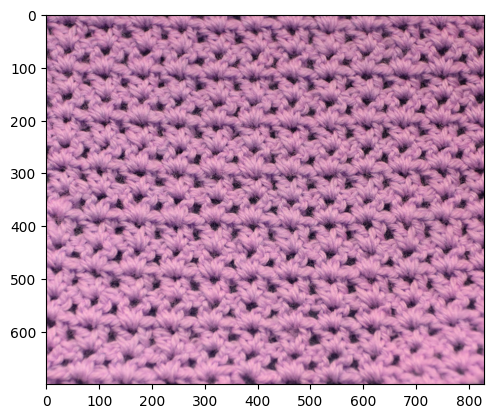

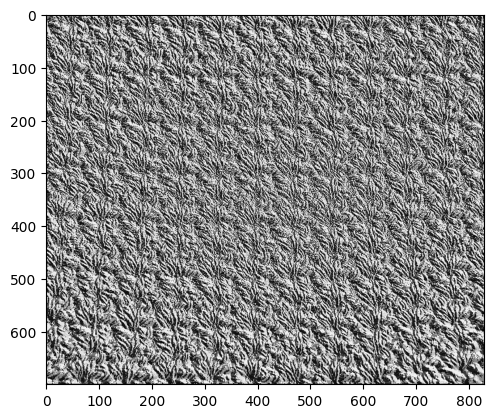

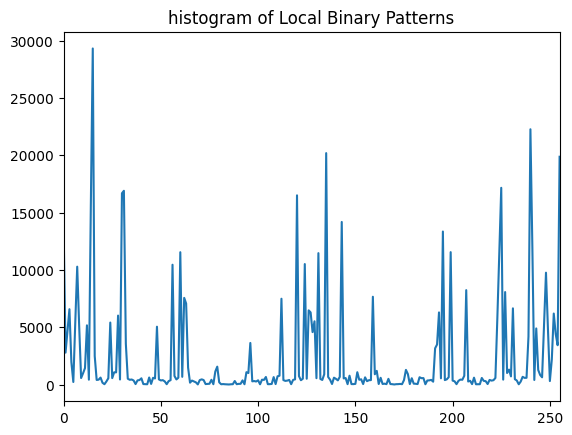

In [357]:
img = cv2.imread('strikk.png',0)

# local Binary Patterns
def get_pixel(img, center, x, y):
      
    new_value = 0
      
    try:
        # If local neighbourhood pixel 
        # value is greater than or equal
        # to center pixel values then 
        # set it to 1
        if img[x][y] >= center:
            new_value = 1
              
    except:
        # Exception is required when 
        # neighbourhood value of a center
        # pixel value is null i.e. values
        # present at boundaries.
        pass
      
    return new_value
   
# Function for calculating LBP
def lbp_calculated_pixel(img, x, y):
   
    center = img[x][y]
   
    val_ar = []
      
    # top_left
    val_ar.append(get_pixel(img, center, x-1, y-1))
      
    # top
    val_ar.append(get_pixel(img, center, x-1, y))
      
    # top_right
    val_ar.append(get_pixel(img, center, x-1, y + 1))
      
    # right
    val_ar.append(get_pixel(img, center, x, y + 1))
      
    # bottom_right
    val_ar.append(get_pixel(img, center, x + 1, y + 1))
      
    # bottom
    val_ar.append(get_pixel(img, center, x + 1, y))
      
    # bottom_left
    val_ar.append(get_pixel(img, center, x + 1, y-1))
      
    # left
    val_ar.append(get_pixel(img, center, x, y-1))
       
    # Now, we need to convert binary
    # values to decimal
    power_val = [1, 2, 4, 8, 16, 32, 64, 128]
   
    val = 0
      
    for i in range(len(val_ar)):
        val += val_ar[i] * power_val[i]
          
    return val
   
path = 'strikk.png'
img_bgr = cv2.imread(path, 1)

if img_bgr is None:
    raise FileNotFoundError(f"Image at path '{path}' not found.")

height, width, _ = img_bgr.shape

# We need to convert RGB image 
# into gray one because gray 
# image has one channel only.
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
   
# Create a numpy array as 
# the same height and width 
# of RGB image
img_lbp = np.zeros((height, width), np.uint8)
   
for i in range(0, height):
    for j in range(0, width):
        img_lbp[i, j] = lbp_calculated_pixel(img_gray, i, j)
  
plt.imshow(img_bgr)
plt.show()
   
plt.imshow(img_lbp, cmap ="gray")
plt.show()

#once we have the local binary patterns, now create the histogram
hist,bin = np.histogram(img_lbp.ravel(),256,[0,255])
plt.xlim([0,255])
plt.plot(hist)
plt.title('histogram of Local Binary Patterns')
plt.show()

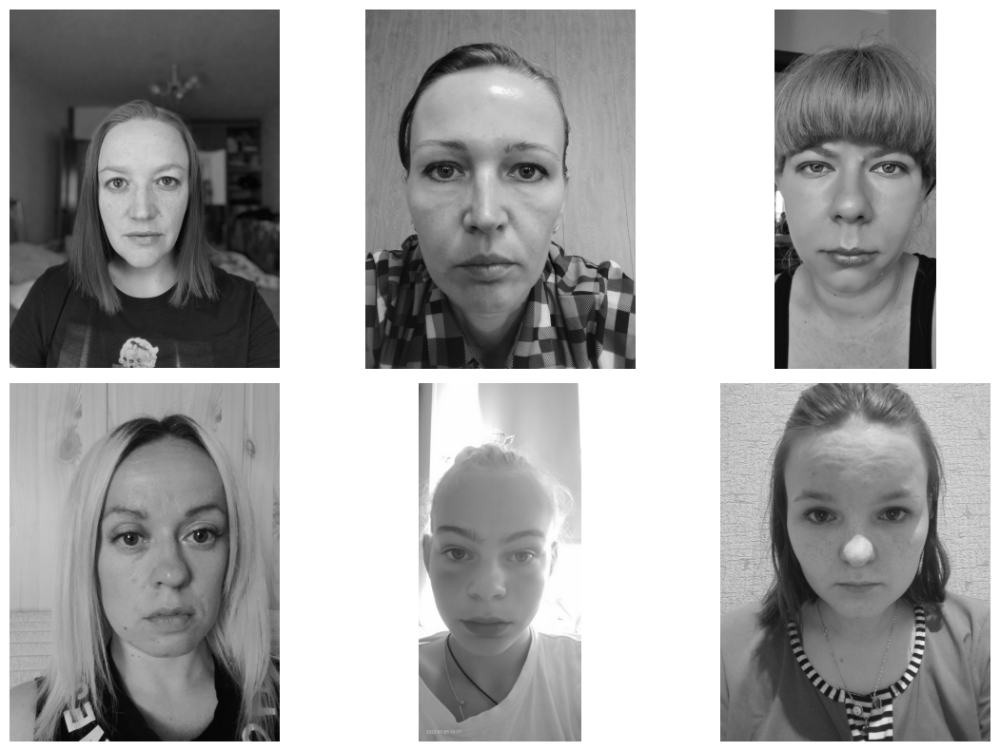

In [358]:
import os
from PIL import Image
import matplotlib.pyplot as plt
# Folder containing the grayscale images
folder_path = "Grayscale portrait"  # Corrected folder name

image_paths = [os.path.join(folder_path, img) for img in ['Neutral.jpg', 'Neutral_2.jpg', 'Neutral_3.jpg', 'Neutral_4.jpg', 'Neutral_5.jpg', 'Neutral_6.jpg']]

# Create a grid of 2x3 to display the images
n_rows = 2
n_cols = 3
# Create a figure and a grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 8))
axes = axes.ravel()

# Check if the folder exists
if not os.path.exists(folder_path):
    raise FileNotFoundError(f"The directory '{folder_path}' does not exist.")


for i in range(6):
    img = Image.open(image_paths[i])  # Open image
    axes[i].imshow(img)  # Display image in respective subplot
    axes[i].axis('off')  # Hide axes

# Display the grid
plt.tight_layout()
plt.show()


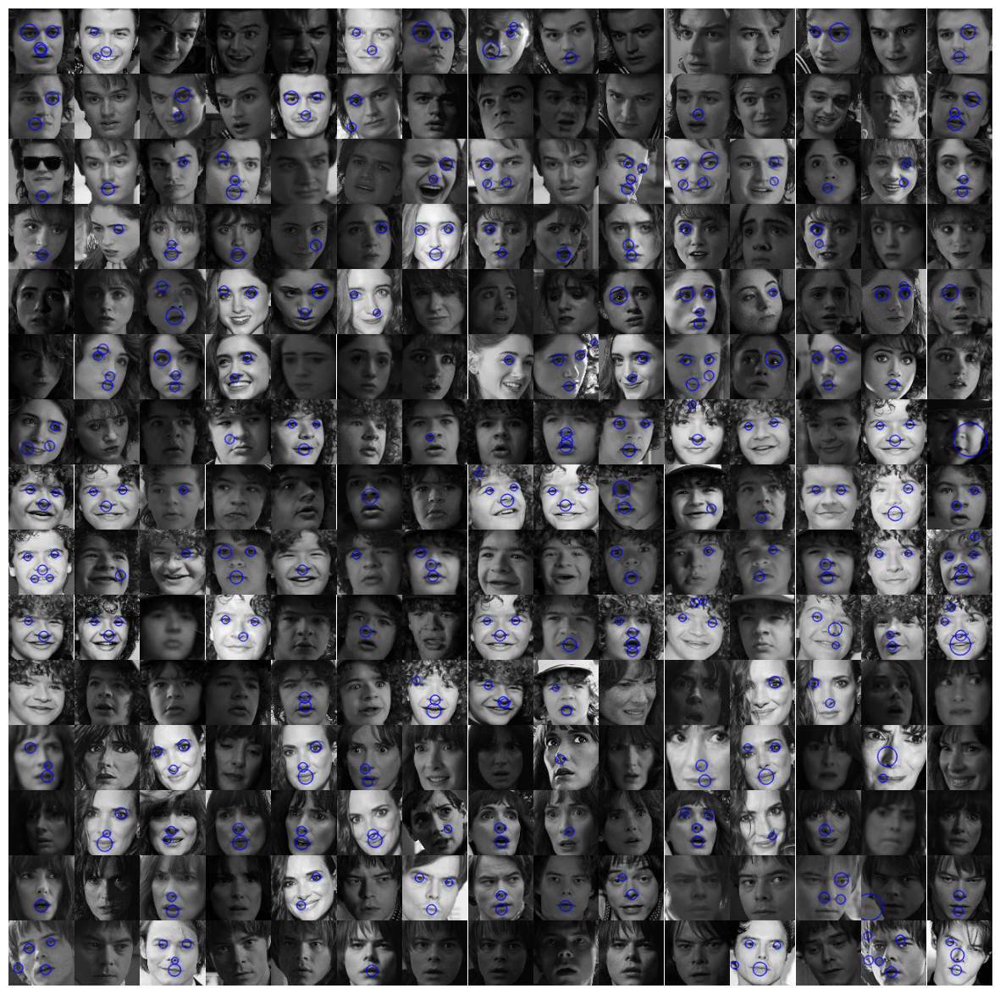

Image: Stranger things grayscale/09-Steve/Stranger-Things-season-3-screenshots-Chapter-3-The-Case-of-the-Missing-Lifeguard-105.jpg-nggid041161-ngg0dyn-1440x716x100-00f0w010c010r110f110r010t010-1.jpg
Number of blobs detected: 4
  Blob 1: Position: (42, 54), Size: 14.55
  Blob 2: Position: (56, 30), Size: 16.04
  Blob 3: Position: (26, 30), Size: 21.66
  Blob 4: Position: (40, 52), Size: 15.76
--------------------------------------------------
Image: Stranger things grayscale/09-Steve/A8sB8zJXLqdf15kF1ygn-2.jpg
Number of blobs detected: 3
  Blob 1: Position: (25, 30), Size: 9.95
  Blob 2: Position: (28, 63), Size: 9.27
  Blob 3: Position: (41, 56), Size: 13.07
--------------------------------------------------
Image: Stranger things grayscale/09-Steve/wv_publicity_pre_launch_A_still_40.000001R-Stranger-Things-season-2-production-stills-138-1.jpg
Number of blobs detected: 0
--------------------------------------------------
Image: Stranger things grayscale/09-Steve/Stranger-Things-season-

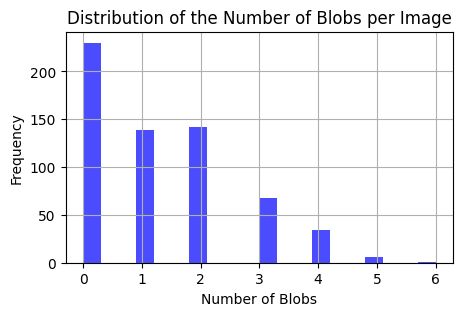

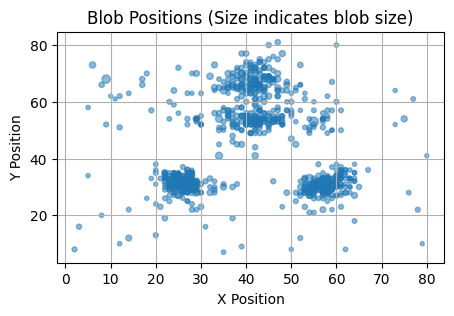

In [361]:
# import os
# from PIL import Image
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# # Function to collect all images from a folder (including subfolders)
# def collect_images_from_folder(folder_path):
#     image_paths = []
#     # Walk through all subfolders and gather image file paths
#     for root, dirs, files in os.walk(folder_path):
#         for file in files:
#             # Add conditions for image file types if necessary
#             if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
#                 image_paths.append(os.path.join(root, file))
#     return image_paths

# # Function to apply blob detection to each image
# def apply_blob_detection(image_paths):
#     # Setup SimpleBlobDetector parameters.
#     params = cv2.SimpleBlobDetector_Params()

#     # Change thresholds
#     params.minThreshold = 50
#     params.maxThreshold = 220

#     # Filter by Area.
#     params.filterByArea = True
#     params.minArea = 50
#     params.maxArea = 2000  

#     # Filter by Circularity
#     params.filterByCircularity = True
#     params.minCircularity = 0.3

#     # Filter by Convexity
#     params.filterByConvexity = False

#     # Filter by Inertia
#     params.filterByInertia = True
#     params.minInertiaRatio = 0.01

#     # Create a detector with the parameters
#     ver = (cv2.__version__).split('.')
#     if int(ver[0]) < 3:
#         detector = cv2.SimpleBlobDetector(params)
#     else:
#         detector = cv2.SimpleBlobDetector_create(params)

#     # Prepare to store blob-detected images and their statistics
#     blob_detected_images = []
#     blob_statistics = []

#     for img_path in image_paths:
#         # Open the image using PIL, convert to grayscale, and resize
#         img = Image.open(img_path).convert('L').resize((86, 86))
#         img_array = np.array(img)

#         # Convert to OpenCV format
#         im_cv = img_array.astype(np.uint8)

#         # Detect blobs
#         keypoints = detector.detect(im_cv)

#         # Draw detected blobs as red circles
#         im_with_keypoints = cv2.drawKeypoints(im_cv, keypoints, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#         # Append the image with detected blobs to the list
#         blob_detected_images.append(im_with_keypoints)

#         # Collect blob statistics for this image
#         num_blobs = len(keypoints)
#         blob_info = [{'position': (int(k.pt[0]), int(k.pt[1])), 'size': k.size} for k in keypoints]
#         blob_statistics.append({
#             'image_path': img_path,
#             'num_blobs': num_blobs,
#             'blobs': blob_info
#         })

#     return blob_detected_images, blob_statistics

# # Function to display images (with blobs detected) in a grid
# def display_images_in_grid(images, rows=15, cols=15):
#     total_images = rows * cols
#     images_to_display = images[:total_images]

#     fig, axs = plt.subplots(rows, cols, figsize=(cols, rows), gridspec_kw={'wspace': 0, 'hspace': 0})
    
#     # Remove padding between images
#     plt.subplots_adjust(wspace=0, hspace=0)
    
#     for i, ax in enumerate(axs.ravel()):
#         if i < len(images_to_display):
#             # Display each blob-detected image
#             ax.imshow(images_to_display[i], cmap='gray')
#             ax.axis('off')  # No axis, just the image
#         else:
#             ax.axis('off')  # In case there are fewer images than grid spots

#     plt.show()

# # Function to display blob statistics for each image
# def display_blob_statistics(blob_statistics):
#     for stats in blob_statistics:
#         print(f"Image: {stats['image_path']}")
#         print(f"Number of blobs detected: {stats['num_blobs']}")
#         for i, blob in enumerate(stats['blobs']):
#             print(f"  Blob {i+1}: Position: {blob['position']}, Size: {blob['size']:.2f}")
#         print("-" * 50)

# # Folder containing the images
# folder_path = 'Stranger things grayscale'  # Update with your folder path

# # Collect all image paths
# image_paths = collect_images_from_folder(folder_path)

# # Apply blob detection to the collected images
# blob_detected_images, blob_statistics = apply_blob_detection(image_paths)

# # Display blob-detected images in a 15x15 grid
# display_images_in_grid(blob_detected_images, rows=15, cols=15)

# # Display statistics for each image
# display_blob_statistics(blob_statistics)

import os
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to collect all images from a folder (including subfolders)
def collect_images_from_folder(folder_path):
    image_paths = []
    # Walk through all subfolders and gather image file paths
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            # Add conditions for image file types if necessary
            if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Function to apply blob detection to each image
def apply_blob_detection(image_paths):
    # Setup SimpleBlobDetector parameters.
    params = cv2.SimpleBlobDetector_Params()

    # Change thresholds
    params.minThreshold = 50
    params.maxThreshold = 220

    # Filter by Area.
    params.filterByArea = True
    params.minArea = 50
    params.maxArea = 2000  

    # Filter by Circularity
    params.filterByCircularity = True
    params.minCircularity = 0.3

    # Filter by Convexity
    params.filterByConvexity = False

    # Filter by Inertia
    params.filterByInertia = True
    params.minInertiaRatio = 0.01

    # Create a detector with the parameters
    ver = (cv2.__version__).split('.')
    if int(ver[0]) < 3:
        detector = cv2.SimpleBlobDetector(params)
    else:
        detector = cv2.SimpleBlobDetector_create(params)

    # Prepare to store blob-detected images and their statistics
    blob_detected_images = []
    blob_statistics = []

    for img_path in image_paths:
        # Open the image using PIL, convert to grayscale, and resize
        img = Image.open(img_path).convert('L').resize((86, 86))
        img_array = np.array(img)

        # Convert to OpenCV format
        im_cv = img_array.astype(np.uint8)

        # Detect blobs
        keypoints = detector.detect(im_cv)

        # Draw detected blobs as red circles
        im_with_keypoints = cv2.drawKeypoints(im_cv, keypoints, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        # Append the image with detected blobs to the list
        blob_detected_images.append(im_with_keypoints)

        # Collect blob statistics for this image
        num_blobs = len(keypoints)
        blob_sizes = [k.size for k in keypoints]  # Sizes of the blobs
        blob_positions = [(int(k.pt[0]), int(k.pt[1])) for k in keypoints]  # Positions of the blobs
        blob_statistics.append({
            'image_path': img_path,
            'num_blobs': num_blobs,
            'blob_sizes': blob_sizes,
            'blob_positions': blob_positions
        })

    return blob_detected_images, blob_statistics

# Function to display images (with blobs detected) in a grid
def display_images_in_grid(images, rows=15, cols=15):
    total_images = rows * cols
    images_to_display = images[:total_images]

    fig, axs = plt.subplots(rows, cols, figsize=(cols, rows), gridspec_kw={'wspace': 0, 'hspace': 0})
    
    # Remove padding between images
    plt.subplots_adjust(wspace=0, hspace=0)
    
    for i, ax in enumerate(axs.ravel()):
        if i < len(images_to_display):
            # Display each blob-detected image
            ax.imshow(images_to_display[i], cmap='gray')
            ax.axis('off')  # No axis, just the image
        else:
            ax.axis('off')  # In case there are fewer images than grid spots

    plt.show()

# Function to display blob statistics for each image
def display_blob_statistics(blob_statistics):
    for stats in blob_statistics:
        print(f"Image: {stats['image_path']}")
        print(f"Number of blobs detected: {stats['num_blobs']}")
        for i, (size, pos) in enumerate(zip(stats['blob_sizes'], stats['blob_positions'])):
            print(f"  Blob {i+1}: Position: {pos}, Size: {size:.2f}")
        print("-" * 50)

# Function to generate and display plots and statistics
def plot_and_summarize(blob_statistics):
    # Extract relevant information
    num_blobs_per_image = [stat['num_blobs'] for stat in blob_statistics]
    all_blob_sizes = [size for stat in blob_statistics for size in stat['blob_sizes']]
    all_blob_positions = [pos for stat in blob_statistics for pos in stat['blob_positions']]

    # Summary statistics
    avg_num_blobs = np.mean(num_blobs_per_image)
    avg_blob_size = np.mean(all_blob_sizes) if all_blob_sizes else 0
    max_num_blobs = max(num_blobs_per_image)
    min_num_blobs = min(num_blobs_per_image)
    image_with_max_blobs = blob_statistics[num_blobs_per_image.index(max_num_blobs)]['image_path']
    image_with_min_blobs = blob_statistics[num_blobs_per_image.index(min_num_blobs)]['image_path']

    print(f"Average number of blobs per image: {avg_num_blobs}")
    print(f"Average blob size: {avg_blob_size:.2f}")
    print(f"Max number of blobs in an image: {max_num_blobs} (Image: {image_with_max_blobs})")
    print(f"Min number of blobs in an image: {min_num_blobs} (Image: {image_with_min_blobs})")
    
    # Plot 1: Histogram of the number of blobs per image
    plt.figure(figsize=(5, 3))
    plt.hist(num_blobs_per_image, bins=20, color='blue', alpha=0.7)
    plt.title('Distribution of the Number of Blobs per Image')
    plt.xlabel('Number of Blobs')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

    # Plot 2: Scatter plot of blob sizes vs positions
    if all_blob_sizes and all_blob_positions:
        x_positions = [pos[0] for pos in all_blob_positions]
        y_positions = [pos[1] for pos in all_blob_positions]

        plt.figure(figsize=(5, 3))
        plt.scatter(x_positions, y_positions, s=all_blob_sizes, alpha=0.5)
        plt.title('Blob Positions (Size indicates blob size)')
        plt.xlabel('X Position')
        plt.ylabel('Y Position')
        plt.grid(True)
        plt.show()

# Folder containing the images
folder_path = 'Stranger things grayscale'  # Update with your folder path

# Collect all image paths
image_paths = collect_images_from_folder(folder_path)

# Apply blob detection to the collected images
blob_detected_images, blob_statistics = apply_blob_detection(image_paths)

# Display blob-detected images in a 15x15 grid
display_images_in_grid(blob_detected_images, rows=15, cols=15)

# Display statistics for each image
display_blob_statistics(blob_statistics)

# Generate and display plots and summary statistics
plot_and_summarize(blob_statistics)




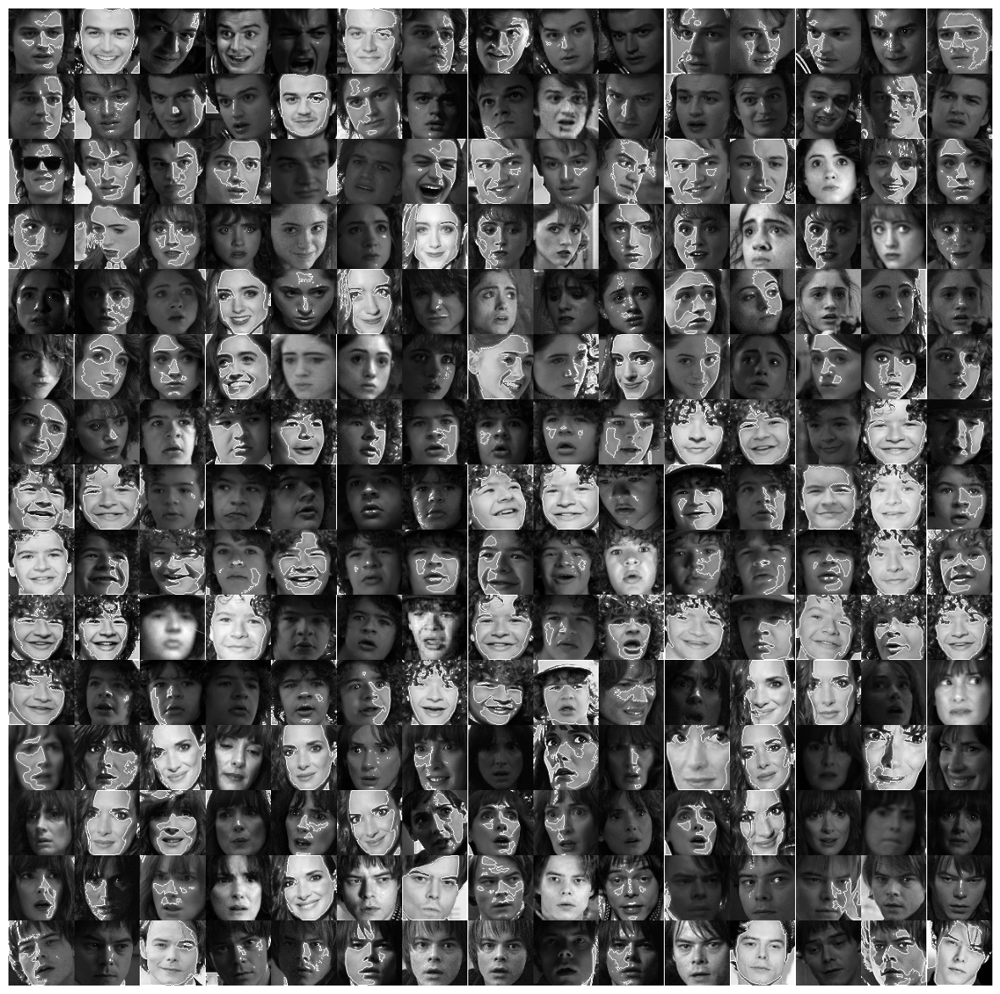

Image: Stranger things grayscale/09-Steve/Stranger-Things-season-3-screenshots-Chapter-3-The-Case-of-the-Missing-Lifeguard-105.jpg-nggid041161-ngg0dyn-1440x716x100-00f0w010c010r110f110r010t010-1.jpg
Number of contours detected: 10
  Contour 1: Area: 1.00, Perimeter: 4.00
  Contour 2: Area: 2.00, Perimeter: 6.00
  Contour 3: Area: 43.00, Perimeter: 33.80
  Contour 4: Area: 0.00, Perimeter: 0.00
  Contour 5: Area: 0.00, Perimeter: 2.00
  Contour 6: Area: 0.00, Perimeter: 0.00
  Contour 7: Area: 56.50, Perimeter: 37.56
  Contour 8: Area: 372.00, Perimeter: 158.37
  Contour 9: Area: 0.50, Perimeter: 3.41
  Contour 10: Area: 338.50, Perimeter: 102.33
--------------------------------------------------
Image: Stranger things grayscale/09-Steve/A8sB8zJXLqdf15kF1ygn-2.jpg
Number of contours detected: 19
  Contour 1: Area: 0.00, Perimeter: 0.00
  Contour 2: Area: 0.00, Perimeter: 7.66
  Contour 3: Area: 17.00, Perimeter: 26.14
  Contour 4: Area: 0.00, Perimeter: 4.00
  Contour 5: Area: 0.00, Per

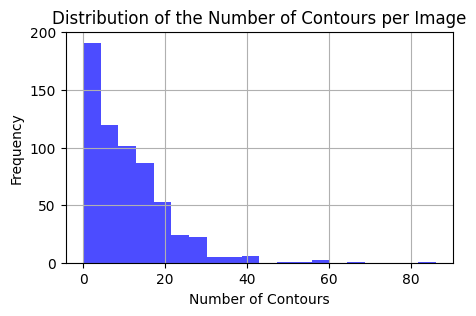

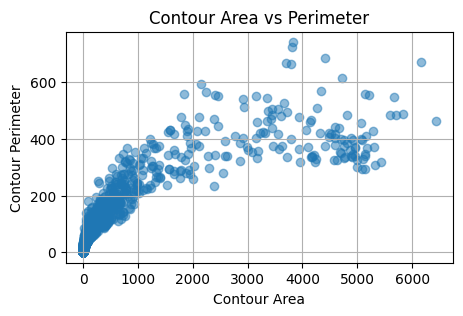

In [363]:
import os
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to collect all images from a folder (including subfolders)
def collect_images_from_folder(folder_path):
    image_paths = []
    # Walk through all subfolders and gather image file paths
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            # Add conditions for image file types if necessary
            if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Function to apply contour detection to each image
def apply_contour_detection(image_paths):
    contour_detected_images = []
    contour_statistics = []

    for img_path in image_paths:
        # Open the image using PIL, convert to grayscale, and resize
        img = Image.open(img_path).convert('L').resize((86, 86))
        img_array = np.array(img)

        # Convert to OpenCV format
        im_cv = img_array.astype(np.uint8)

        # Apply thresholding or edge detection for better contour detection
        _, thresholded = cv2.threshold(im_cv, 127, 255, cv2.THRESH_BINARY)

        # Detect contours
        contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Draw the contours on the image
        im_with_contours = cv2.drawContours(im_cv.copy(), contours, -1, (255, 0, 0), 1)

        # Append the image with contours to the list
        contour_detected_images.append(im_with_contours)

        # Collect contour statistics for this image
        num_contours = len(contours)
        contour_areas = [cv2.contourArea(c) for c in contours]  # Areas of the contours
        contour_perimeters = [cv2.arcLength(c, True) for c in contours]  # Perimeters of the contours

        contour_statistics.append({
            'image_path': img_path,
            'num_contours': num_contours,
            'contour_areas': contour_areas,
            'contour_perimeters': contour_perimeters
        })

    return contour_detected_images, contour_statistics

# Function to display images (with contours detected) in a grid
def display_images_in_grid(images, rows=15, cols=15):
    total_images = rows * cols
    images_to_display = images[:total_images]

    fig, axs = plt.subplots(rows, cols, figsize=(cols, rows), gridspec_kw={'wspace': 0, 'hspace': 0})
    
    # Remove padding between images
    plt.subplots_adjust(wspace=0, hspace=0)
    
    for i, ax in enumerate(axs.ravel()):
        if i < len(images_to_display):
            # Display each contour-detected image
            ax.imshow(images_to_display[i], cmap='gray')
            ax.axis('off')  # No axis, just the image
        else:
            ax.axis('off')  # In case there are fewer images than grid spots

    plt.show()

# Function to display contour statistics for each image
def display_contour_statistics(contour_statistics):
    for stats in contour_statistics:
        print(f"Image: {stats['image_path']}")
        print(f"Number of contours detected: {stats['num_contours']}")
        for i, (area, perimeter) in enumerate(zip(stats['contour_areas'], stats['contour_perimeters'])):
            print(f"  Contour {i+1}: Area: {area:.2f}, Perimeter: {perimeter:.2f}")
        print("-" * 50)

# Function to generate and display plots and statistics
def plot_and_summarize_contours(contour_statistics):
    # Extract relevant information
    num_contours_per_image = [stat['num_contours'] for stat in contour_statistics]
    all_contour_areas = [area for stat in contour_statistics for area in stat['contour_areas']]
    all_contour_perimeters = [perimeter for stat in contour_statistics for perimeter in stat['contour_perimeters']]

    # Summary statistics
    avg_num_contours = np.mean(num_contours_per_image)
    avg_contour_area = np.mean(all_contour_areas) if all_contour_areas else 0
    avg_contour_perimeter = np.mean(all_contour_perimeters) if all_contour_perimeters else 0
    max_num_contours = max(num_contours_per_image)
    min_num_contours = min(num_contours_per_image)
    image_with_max_contours = contour_statistics[num_contours_per_image.index(max_num_contours)]['image_path']
    image_with_min_contours = contour_statistics[num_contours_per_image.index(min_num_contours)]['image_path']

    print(f"Average number of contours per image: {avg_num_contours}")
    print(f"Average contour area: {avg_contour_area:.2f}")
    print(f"Average contour perimeter: {avg_contour_perimeter:.2f}")
    print(f"Max number of contours in an image: {max_num_contours} (Image: {image_with_max_contours})")
    print(f"Min number of contours in an image: {min_num_contours} (Image: {image_with_min_contours})")
    
    # Plot 1: Histogram of the number of contours per image
    plt.figure(figsize=(5, 3))
    plt.hist(num_contours_per_image, bins=20, color='blue', alpha=0.7)
    plt.title('Distribution of the Number of Contours per Image')
    plt.xlabel('Number of Contours')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

    # Plot 2: Scatter plot of contour areas vs perimeters
    if all_contour_areas and all_contour_perimeters:
        plt.figure(figsize=(5, 3))
        plt.scatter(all_contour_areas, all_contour_perimeters, alpha=0.5)
        plt.title('Contour Area vs Perimeter')
        plt.xlabel('Contour Area')
        plt.ylabel('Contour Perimeter')
        plt.grid(True)
        plt.show()

# Folder containing the images
folder_path = 'Stranger things grayscale'  # Update with your folder path

# Collect all image paths
image_paths = collect_images_from_folder(folder_path)

# Apply contour detection to the collected images
contour_detected_images, contour_statistics = apply_contour_detection(image_paths)

# Display contour-detected images in a 15x15 grid
display_images_in_grid(contour_detected_images, rows=15, cols=15)

# Display statistics for each image
display_contour_statistics(contour_statistics)

# Generate and display plots and summary statistics
plot_and_summarize_contours(contour_statistics)

